![Allstate Claims Severity](../assets/allstate_banner-660x120.png)

When you’ve been devastated by a serious car accident, your focus is on the things that matter the most: family, friends, and other loved ones. Pushing paper with your insurance agent is the last place you want your time or mental energy spent. This is why Allstate, a personal insurer in the United States, is continually seeking fresh ideas to improve their claims service for the over 16 million households they protect.

Allstate is currently developing automated methods of predicting the cost, and hence severity, of claims. In this recruitment challenge, Kagglers are invited to show off their creativity and flex their technical chops by creating an algorithm which accurately predicts claims severity. Aspiring competitors will demonstrate insight into better ways to predict claims severity for the chance to be part of Allstate’s efforts to ensure a worry-free customer experience.

Each row in this dataset represents an insurance claim. You must predict the value for the 'loss' column. Variables prefaced with 'cat' are categorical, while those prefaced with 'cont' are continuous.

# **<span style="color:orange;">Import Libraries</span>**

In [51]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import math
from wordcloud import WordCloud
import statsmodels.api as sm
from scipy.stats import iqr
pd.set_option('display.max_columns', None)

# **<span style="color:orange;">Reading Data</span>**

In [52]:
def get_data():
    BASE_DIR = Path.cwd().parents[0]
    file_name = 'claims-severity-anonymized-raw.csv'
    return pd.read_csv(BASE_DIR / 'data' / 'allstate-claims-severity' / file_name, on_bad_lines="skip")

In [53]:
# Reading data from source
df = get_data()

In [54]:
# Preview of data
df.head(5)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1.0,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2.0,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5.0,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,B,D,B,D,C,B,B,B,A,A,A,A,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10.0,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11.0,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,C,A,A,A,B,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [55]:
# Shape of data
df.shape

(188319, 132)

📌 Raw Dataset Shape

The raw dataset has a shape of (188,319 rows, 132 columns), indicating a large and high-dimensional data.

In [56]:
# Datatype of features
df.dtypes.value_counts()

object     116
float64     16
Name: count, dtype: int64

📌 Features Data Type

The dataset comprises a total of 132 features, spanning multiple data types. Among these, 116 features are of object type, indicating a strong presence of categorical variables. In contrast, 16 features are of type float64, representing the dataset’s numerical attributes.

In [57]:
# Summary of Dataset: Numerical Only
df.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188319.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,294134.420660,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,169336.991768,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186
min,0.348388,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000
25%,147747.000000,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000
50%,294537.000000,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000
75%,440679.000000,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000
max,587633.000000,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


In [58]:
# Summary of Dataset: Categorical Only
df.describe(include='O')

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
count,188319,188319,188319,188319,188319,188319,188319,188319,188319,188319,188319,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318
unique,3,3,3,3,3,3,3,3,3,3,3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326
top,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK
freq,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061


### **<span style="color:orange;">Analysis of Null Values</span>**

In [59]:
# Checking for null values per feature
df.isna().sum().to_frame(name='# null values').T

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
# null values,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [60]:
# Overall null values
df.isna().sum().sum()

np.int64(120)

📌 Sparse Missingness Across Features

Out of the 132 total features in the dataset, 120 features contain exactly one missing value each, as indicated by a total of 120 null entries across these columns. It means that these 120 rows can be dropped in data cleaning stage.

### **<span style="color:orange;">Analysis of Duplicate Rows</span>**

In [61]:
# Checking for duplicate rows
df.duplicated().sum()

np.int64(0)

📌 Duplicate Record Check

An evaluation of the dataset confirms that no duplicate rows are present. This indicates that each record in the dataset is unique, with no repeated entries across all observations.

# **<span style="color:orange;">1. Univariate Analysis</span>**

In [62]:
df.head(5)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1.0,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2.0,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5.0,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,B,D,B,D,C,B,B,B,A,A,A,A,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10.0,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11.0,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,C,A,A,A,B,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [63]:
# List of Categorical Features
cat_cols = df.select_dtypes(include='O').columns.to_list()

# List of Numerical Features
num_cols = df.select_dtypes(include=float).columns.to_list()
num_cols.remove('id')
num_cols.remove('loss')

print(cat_cols)
print("="*50)
print(num_cols)

['cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8', 'cat9', 'cat10', 'cat11', 'cat12', 'cat13', 'cat14', 'cat15', 'cat16', 'cat17', 'cat18', 'cat19', 'cat20', 'cat21', 'cat22', 'cat23', 'cat24', 'cat25', 'cat26', 'cat27', 'cat28', 'cat29', 'cat30', 'cat31', 'cat32', 'cat33', 'cat34', 'cat35', 'cat36', 'cat37', 'cat38', 'cat39', 'cat40', 'cat41', 'cat42', 'cat43', 'cat44', 'cat45', 'cat46', 'cat47', 'cat48', 'cat49', 'cat50', 'cat51', 'cat52', 'cat53', 'cat54', 'cat55', 'cat56', 'cat57', 'cat58', 'cat59', 'cat60', 'cat61', 'cat62', 'cat63', 'cat64', 'cat65', 'cat66', 'cat67', 'cat68', 'cat69', 'cat70', 'cat71', 'cat72', 'cat73', 'cat74', 'cat75', 'cat76', 'cat77', 'cat78', 'cat79', 'cat80', 'cat81', 'cat82', 'cat83', 'cat84', 'cat85', 'cat86', 'cat87', 'cat88', 'cat89', 'cat90', 'cat91', 'cat92', 'cat93', 'cat94', 'cat95', 'cat96', 'cat97', 'cat98', 'cat99', 'cat100', 'cat101', 'cat102', 'cat103', 'cat104', 'cat105', 'cat106', 'cat107', 'cat108', 'cat109', 'cat110', 'cat111

In [64]:
for col in cat_cols:
    print(df[col].value_counts())
    print("="*40)

cat1
A           141550
B            46768
 .672862         1
Name: count, dtype: int64
cat2
A           106721
B            81597
 .551054         1
Name: count, dtype: int64
cat3
A           177993
B            10325
 .344450         1
Name: count, dtype: int64
cat4
A           128395
B            59923
 .447670         1
Name: count, dtype: int64
cat5
A           123737
B            64581
 .538810         1
Name: count, dtype: int64
cat6
A           131693
B            56625
 .492200         1
Name: count, dtype: int64
cat7
A           183744
B             4574
 .481306         1
Name: count, dtype: int64
cat8
A           177274
B            11044
 .654753         1
Name: count, dtype: int64
cat9
A           113122
B            75196
 .406237         1
Name: count, dtype: int64
cat10
A          160213
B           28105
 772.56         1
Name: count, dtype: int64
cat11
A     168186
B      20132
\n         1
Name: count, dtype: int64
cat12
A    159825
B     28493
Name: count, dtype: i

In [65]:
unique_labels = []
for col in cat_cols:
    unique_labels.append({
        'col':col,
        'nunique':df[col].nunique()
    })
unique_labels_df = pd.DataFrame(unique_labels)
unique_labels_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115
col,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
nunique,3,3,3,3,3,3,3,3,3,3,3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326


### **<span style="color:orange;">1.1 CountPlot of Categorical Features</span>**

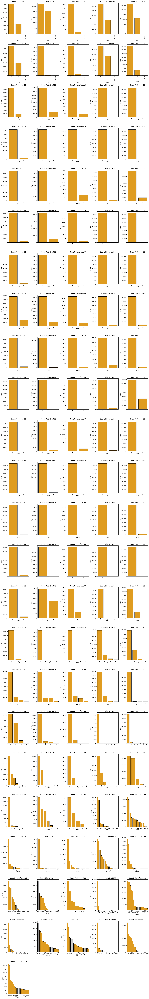

In [66]:
n_cols = 5
n_rows = math.ceil(len(cat_cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

for ax, col in zip(axes, cat_cols):

    top_categories = (
        df[col]
        .value_counts(dropna=True)
        .nlargest(20)
        .index
    )

    plot_data = df[col].where(df[col].isin(top_categories))

    sns.countplot(
        x=plot_data,
        ax=ax,
        order=plot_data.value_counts().index,
        color="orange",
        edgecolor="black"
    )

    ax.set_title(f"Count Plot of {col}", fontsize=14)
    ax.set_xlabel(col)
    ax.set_ylabel("Count")
    ax.tick_params(axis="x", rotation=90)

# Remove unused subplots
for ax in axes[len(cat_cols):]:
    ax.remove()

plt.tight_layout()
plt.show()

In [121]:
temp_df = df.dropna(axis=0, ignore_index=True)

unique_labels = [temp_df[col].nunique() for col in cat_cols]

fig = px.line(
    x=cat_cols,
    y=unique_labels,
    markers=True,
    labels={
        "x": "Categorical Features",
        "y": "Number of Unique Values"
    }
)
fig.update_layout(
    title={
        "text": "Unique Category Count per Feature",
        "x": 0.5,
        "xanchor": "center",
        "font": {"size": 18}
    }
)

fig.show()

### **<span style="color:orange;">1.2 Pie Chart of Categorical Features</span>**

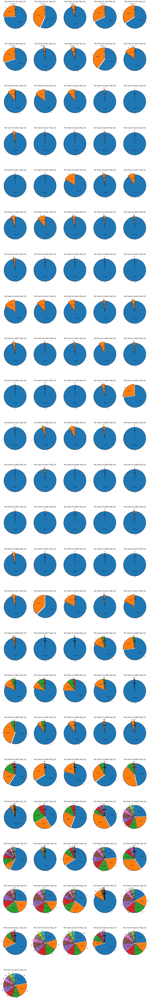

In [67]:
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

for ax, col in zip(axes, cat_cols):

    value_counts = (
        df[col]
        .value_counts(dropna=True)
        .nlargest(10)
    )

    # explode all slices slightly
    explode = [0.05] * len(value_counts)

    ax.pie(
        value_counts.values,
        labels=value_counts.index,
        autopct="%1.1f%%",
        startangle=90,
        counterclock=False,
        explode=explode,
        shadow=True,
        wedgeprops=dict(
            edgecolor="black",
            linewidth=1
        )
    )

    ax.set_title(f"Pie Chart of {col} (Top 10)", fontsize=14)

# Remove unused subplots
for ax in axes[len(cat_cols):]:
    ax.remove()

plt.tight_layout()
plt.show()

### **<span style="color:orange;">1.3 Word Cloud of High Cardinal Categorical Features</span>**

In [68]:
n = 0
high_cardinality_cat_features = []
for col in cat_cols:
    if df[col].nunique() > 20:
        high_cardinality_cat_features.append(col)
        n +=1
print(f'There are {n} Categorical Features which high Cardinality.')

There are 6 Categorical Features which high Cardinality.


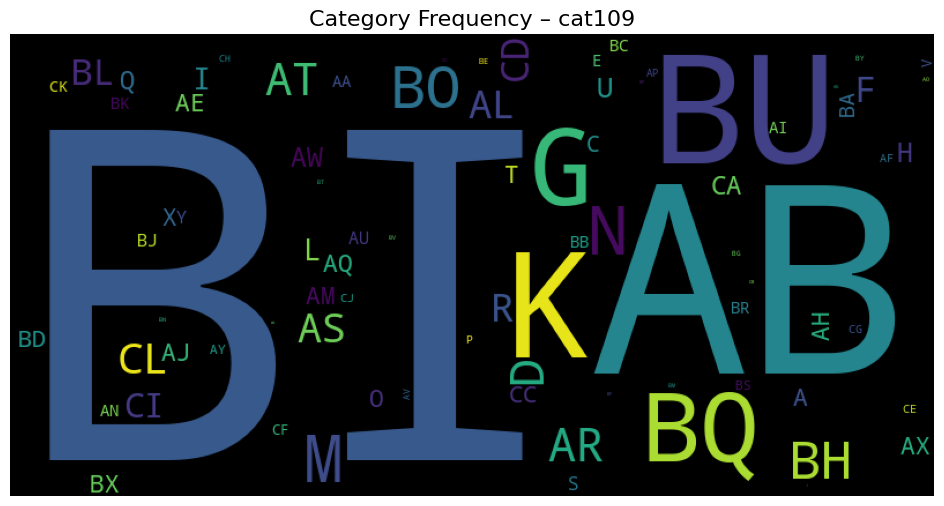

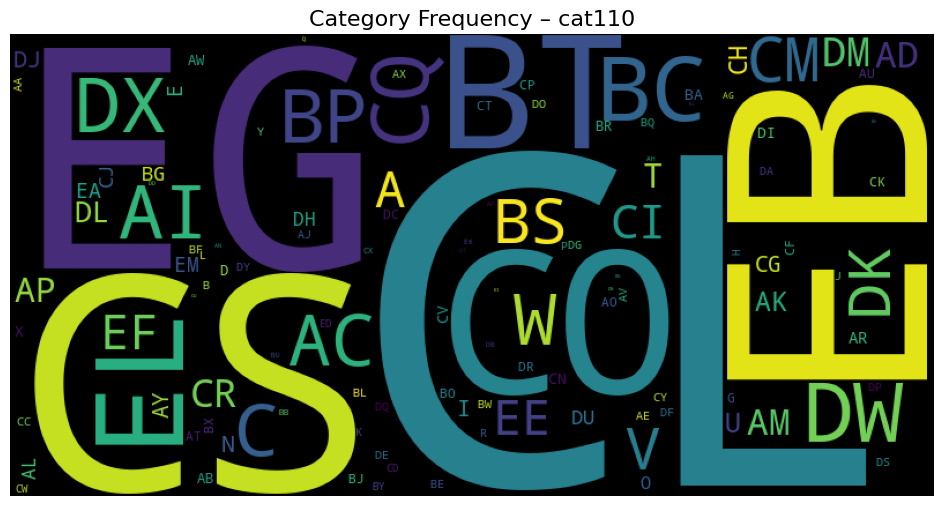

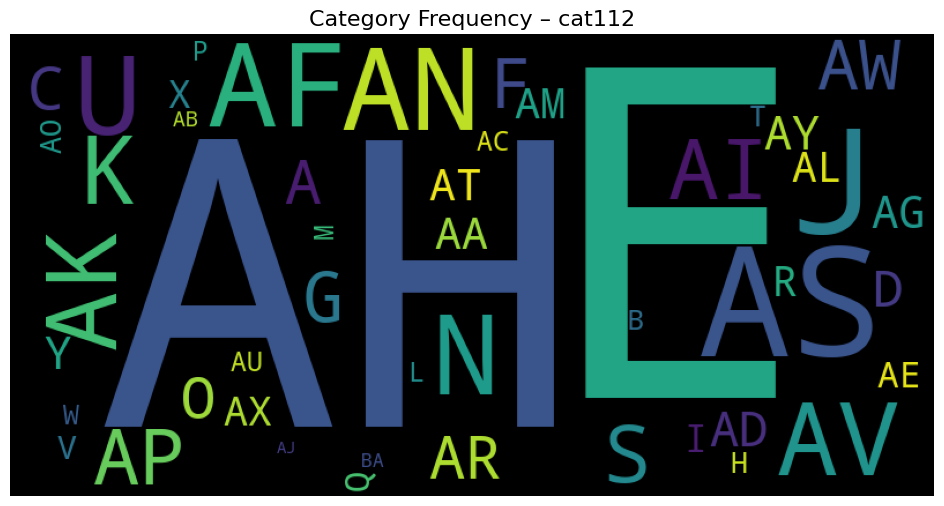

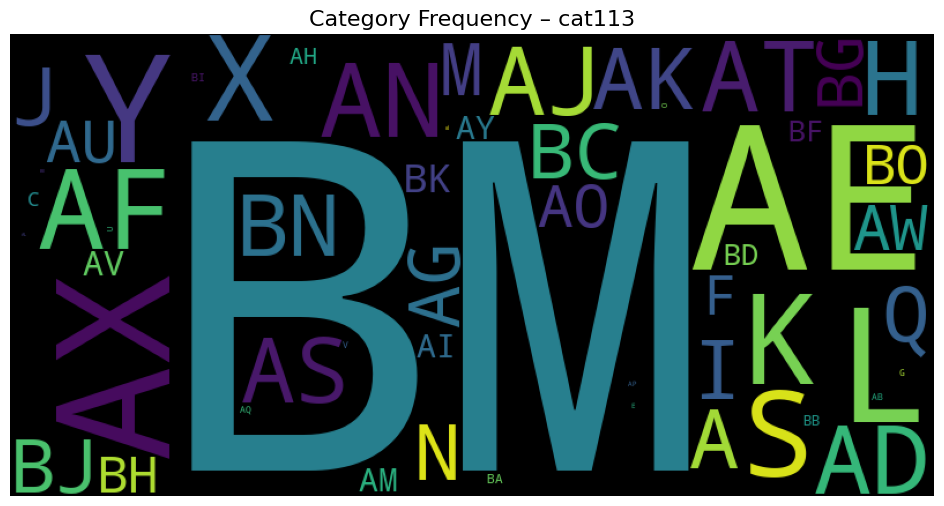

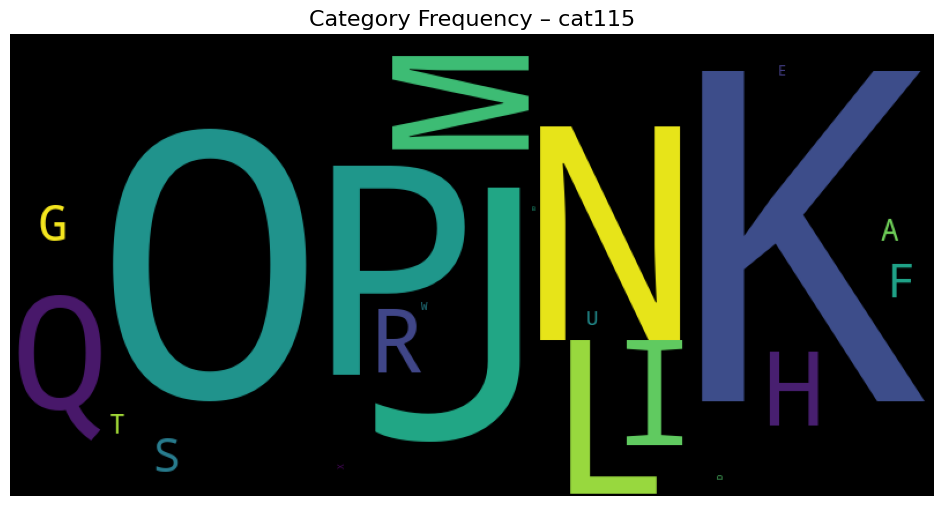

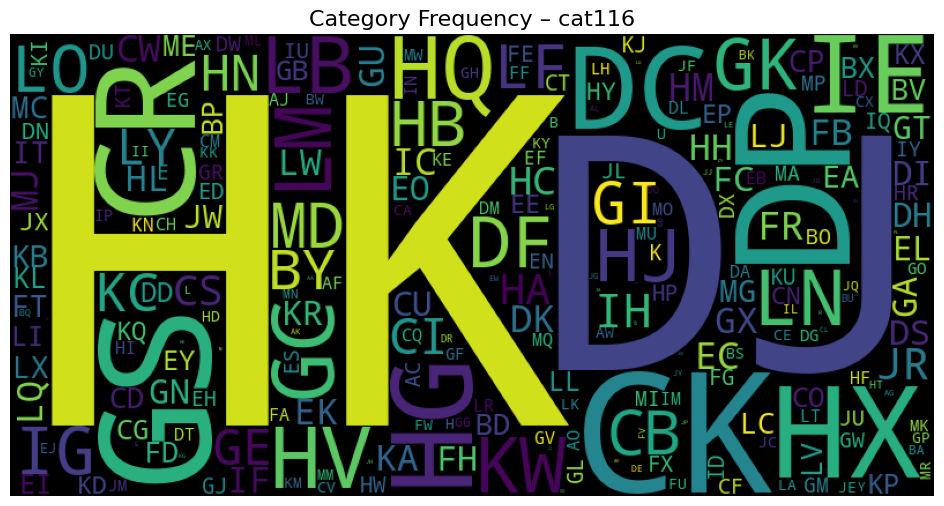

In [69]:
for col in high_cardinality_cat_features:
    freqs = (
        df[col]
        .dropna()
        .astype(str)
        .value_counts()
        .to_dict()
    )

    wc = WordCloud(
        width=800,
        height=400,
        background_color='black',
        max_words=-1
    ).generate_from_frequencies(freqs)

    plt.figure(figsize=(12, 6))
    plt.imshow(wc)
    plt.axis('off')
    plt.title(f"Category Frequency – {col}", fontsize=16)
    plt.show()

### **<span style="color:orange;">1.4 Histogram Plot of Numerical Features</span>**

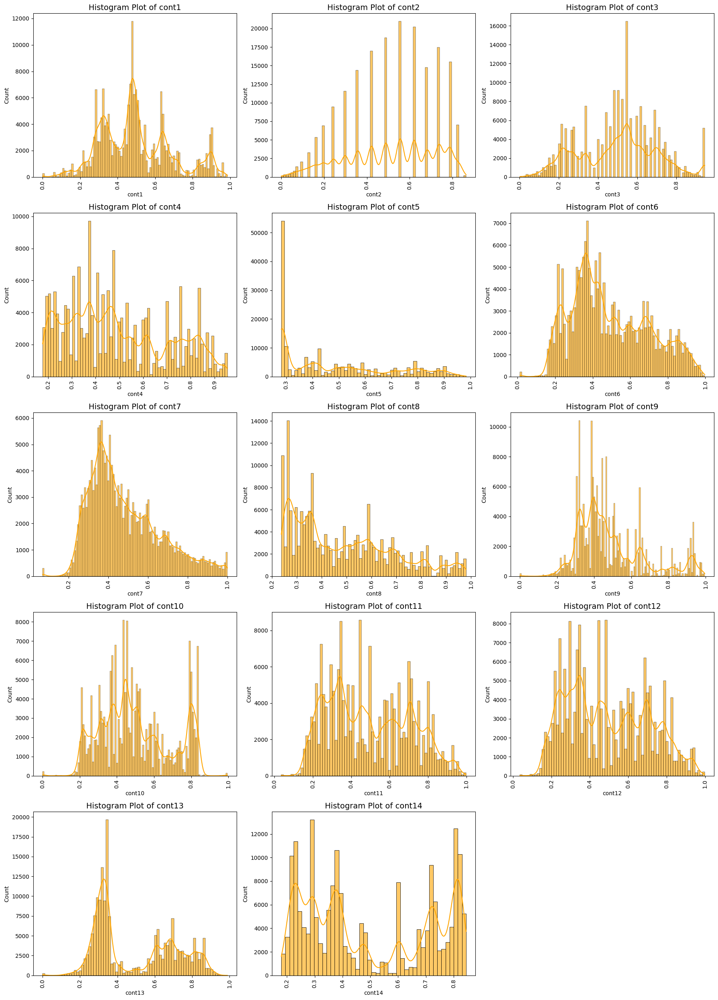

In [107]:
n_cols = 3
n_rows = math.ceil(len(num_cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

for ax, col in zip(axes, num_cols):
    sns.histplot(
        data=df,
        x=col,
        color="orange",
        edgecolor="black",
        alpha=0.6,
        ax=ax,
        kde=True
    )
    ax.set_title(f"Histogram Plot of {col}", fontsize=14)
    ax.set_xlabel(col)
    ax.set_ylabel("Count")
    ax.tick_params(axis="x", rotation=90)

# Remove unused subplots
for ax in axes[len(num_cols):]:
    ax.remove()

plt.tight_layout()
plt.show()

### **<span style="color:orange;">1.5 Boxplot of Numerical Features</span>**

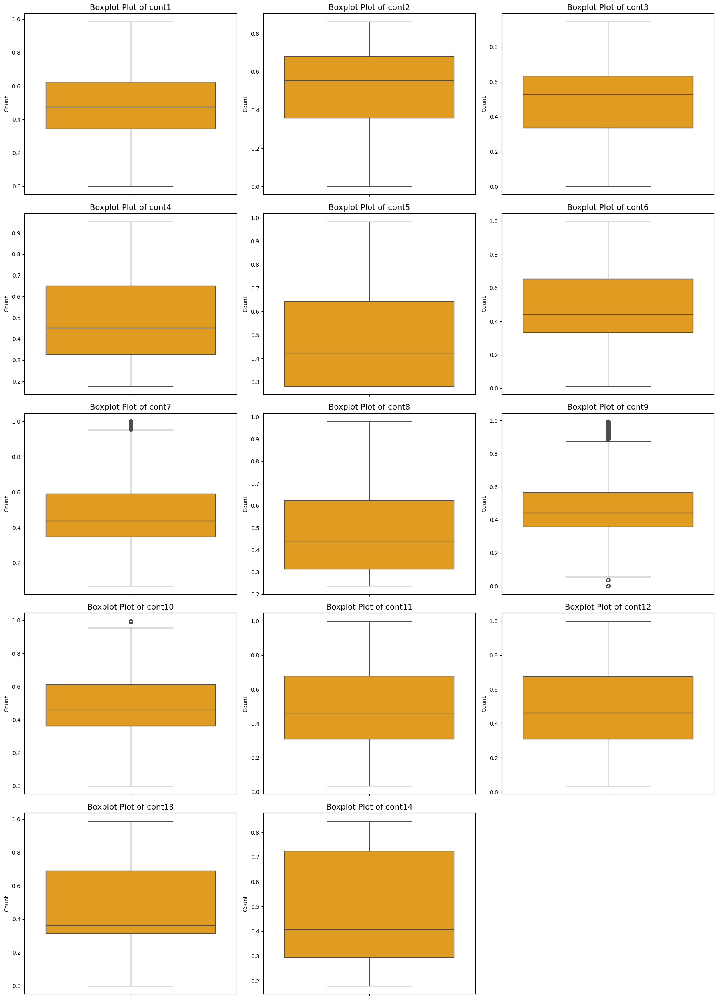

In [71]:
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

for ax, col in zip(axes, num_cols):
    sns.boxplot(
        data=df,
        y=col,
        color="orange",
        ax=ax,
    )
    ax.set_title(f"Boxplot Plot of {col}", fontsize=14)
    ax.set_ylabel("Count")
    ax.tick_params(axis="x", rotation=90)

# Remove unused subplots
for ax in axes[len(num_cols):]:
    ax.remove()

plt.tight_layout()
plt.show()

### **<span style="color:orange;">1.6 Quantile-Quantile Plot of Numerical Features</span>**

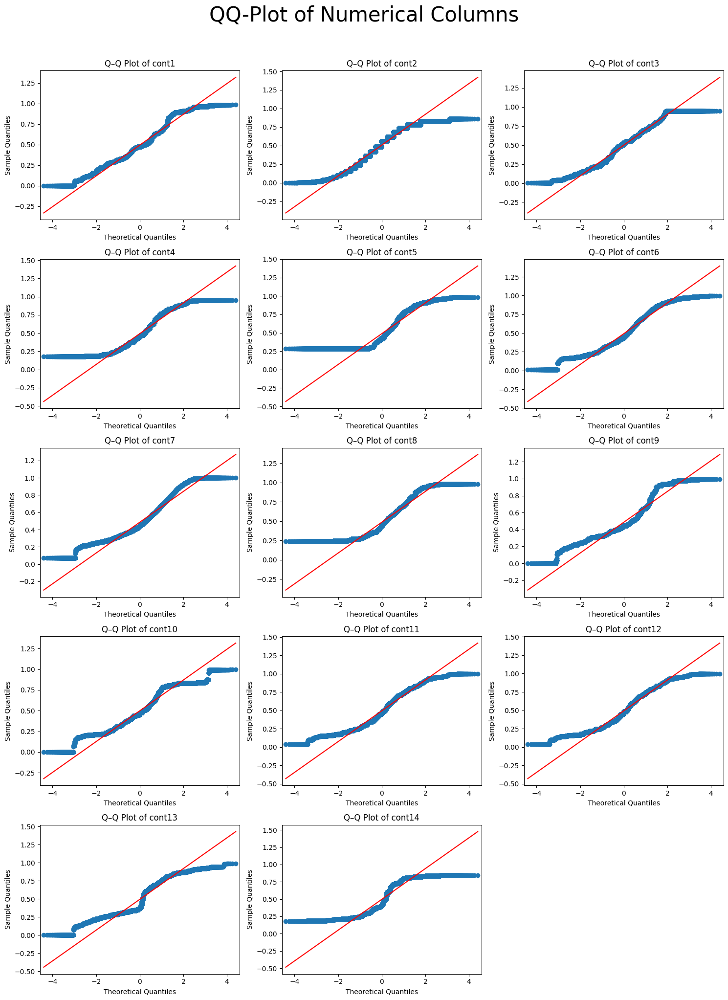

In [72]:
# Q-Q plots of numerical columns
n_cols = 3
n_rows = math.ceil(len(num_cols) / n_cols)

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sm.qqplot(df[col].dropna(), line='s', ax=plt.gca())  # line='s' adds a reference line
    plt.title(f"Q–Q Plot of {col}")

plt.suptitle("QQ-Plot of Numerical Columns", fontsize=30, y=1.02)
plt.tight_layout()
plt.show()

### **<span style="color:orange;">1.7 Statistical Analysis for Numerical Features</span>**

#### **<span style="color:orange;">1.7.1 Skewness and Kurtosis</span>**

In [73]:
# Let's check for skewness
skewness = [df[col].skew() for col in num_cols]
kurtosis = [df[col].kurtosis() for col in num_cols]
skew_df = pd.DataFrame({
    "feature": num_cols,
    "skewness": skewness,
    "Kurtosis": kurtosis
})
skew_df

,feature,skewness,Kurtosis
0,cont1,0.516424,-0.101712
1,cont2,-0.310941,-0.895657
2,cont3,-0.010002,-0.606562
3,cont4,0.416096,-0.965424
4,cont5,0.681622,-0.876877
5,cont6,0.461214,-0.760544
6,cont7,0.826053,0.050145
7,cont8,0.676634,-0.542127
8,cont9,1.072429,0.563925
9,cont10,0.355001,-0.851664


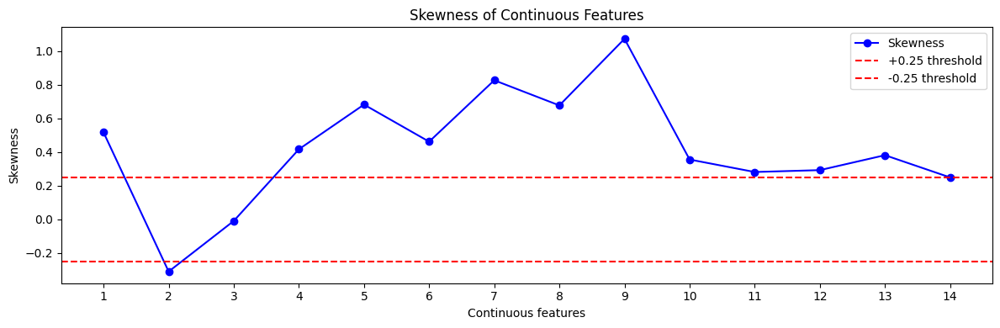

In [106]:
plt.figure(figsize=(12,4))

plt.plot(skewness, marker="o", linestyle="-", color="blue", label="Skewness")

plt.axhline(0.25, color="red", linestyle="--", label="+0.25 threshold")
plt.axhline(-0.25, color="red", linestyle="--", label="-0.25 threshold")

plt.xlabel("Continuous features")
plt.ylabel("Skewness")
plt.title("Skewness of Continuous Features")

plt.xticks(range(len(skewness)), range(1, len(skewness) + 1))
plt.legend()
plt.tight_layout()
plt.show()


📌 Distributional Characteristics of Continuous Features

An analysis of skewness and kurtosis across the continuous features reveals notable variation in their distributional properties.

Most continuous variables (cont1–cont14) exhibit low to moderate skewness, with values generally ranging between −0.31 and 1.07. This indicates that the majority of features are approximately symmetric to mildly right-skewed, with no extreme asymmetry. Features such as cont7, cont8, and cont9 show comparatively higher positive skewness, suggesting longer right tails relative to other variables.

In terms of kurtosis, nearly all continuous features display negative kurtosis values, indicating platykurtic distributions. This suggests that these variables are flatter than a normal distribution, with lighter tails and fewer extreme values. The consistency of negative kurtosis across most features highlights a general lack of heavy-tailed behavior in the majority of predictors.

The id feature shows near-zero skewness and moderately negative kurtosis, reflecting a uniform-like distribution, which is typical for identifier variables.

In contrast, the loss variable stands out significantly from the rest of the features. It exhibits extreme positive skewness (3.79) and very high kurtosis (48.08), indicating a highly right-skewed and heavy-tailed distribution. This suggests that while most loss values are relatively small, a small number of observations take on very large values, contributing disproportionately to the overall distribution shape.

Overall, the distributional analysis shows that while most continuous features are well-behaved and moderately distributed, the target variable displays strong non-normality, characterized by substantial skewness and extreme tail behavior.

#### **<span style="color:orange;">1.7.2 Outliers Analysis</span>**

In [74]:
def iqr_outlier_counts(series, k=1.5):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr_val = iqr(series, nan_policy="omit")

    lower = q1 - k * iqr_val
    upper = q3 + k * iqr_val

    below = (series < lower).sum()
    above = (series > upper).sum()

    return below, above


In [75]:
outlier_rows = []

for col in num_cols:
    below, above = iqr_outlier_counts(df[col])
    outlier_rows.append({
        "feature": col,
        "below_count": below,
        "above_count": above,
        "total_outliers": below + above
    })

outlier_df = pd.DataFrame(outlier_rows)
outlier_df

,feature,below_count,above_count,total_outliers
0,cont1,0,0,0
1,cont2,0,0,0
2,cont3,0,0,0
3,cont4,0,0,0
4,cont5,0,0,0
5,cont6,0,0,0
6,cont7,0,2659,2659
7,cont8,0,0,0
8,cont9,206,12988,13194
9,cont10,0,140,140


In [76]:
def iqr_bounds(series, k=1.5):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr_val = iqr(series, nan_policy="omit")
    return q1 - k * iqr_val, q3 + k * iqr_val

In [83]:
# Feature: loss
df.loc[(df.cont7 < iqr_bounds(df.cont7)[0]) | (df.cont7 > iqr_bounds(df.cont7)[1])][num_cols].head(10)

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
77,0.278999,0.127059,0.844219,0.345595,0.302678,0.282443,0.985762,0.24123,0.16380,0.33428,0.787589,0.775245,0.177507,0.400594
106,0.535150,0.488789,0.336963,0.284048,0.380560,0.532062,0.982302,0.60087,0.50840,0.56081,0.802827,0.790803,0.263731,0.836519
179,0.570971,0.620805,0.916157,0.244390,0.397069,0.912653,0.993938,0.28280,0.52938,0.72667,0.941415,0.944062,0.832018,0.750391
275,0.854511,0.358319,0.298977,0.275813,0.281143,0.923434,0.954830,0.38885,0.81945,0.80218,0.888438,0.879347,0.846403,0.313554
301,0.292010,0.620805,0.901670,0.383428,0.356315,0.346681,0.997761,0.32843,0.16265,0.42284,0.902989,0.894630,0.181433,0.793257
327,0.601902,0.245921,0.634224,0.318422,0.281143,0.688201,0.984730,0.56600,0.61751,0.62507,0.853569,0.843026,0.363547,0.602666
369,0.599120,0.245921,0.613660,0.215482,0.372405,0.571021,0.953884,0.29758,0.52100,0.40131,0.771508,0.758883,0.204240,0.377193
406,0.634734,0.358319,0.549770,0.244390,0.281143,0.530305,0.965359,0.29758,0.65064,0.53328,0.782322,0.769880,0.312885,0.721362
490,0.513457,0.555782,0.944251,0.373816,0.281143,0.560330,0.999259,0.32317,0.44767,0.52221,0.988937,0.987291,0.233856,0.286031
503,0.665069,0.159990,0.613660,0.215482,0.281143,0.589351,0.979276,0.27320,0.62147,0.40131,0.771508,0.758883,0.215289,0.837205


In [78]:
# Feature: cont9
df.loc[(df.cont9 < iqr_bounds(df.cont9)[0]) | (df.cont9 > iqr_bounds(df.cont9)[1])][num_cols].head(10)

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
14,0.894333,0.299102,0.094942,0.722125,0.281143,0.894903,0.586433,0.80058,0.93383,0.78770,0.880469,0.871011,0.822493,0.251278
33,0.894333,0.299102,0.280933,0.713852,0.281143,0.731498,0.438285,0.75964,0.93383,0.78770,0.711942,0.714544,0.751507,0.673856
42,0.853789,0.555782,0.317666,0.309621,0.863000,0.547545,0.431372,0.73247,0.91898,0.60932,0.592525,0.579845,0.723122,0.810941
45,0.914335,0.737068,0.317666,0.802892,0.635304,0.894682,0.671992,0.80438,0.93884,0.80218,0.821840,0.832658,0.854872,0.338507
62,0.883459,0.358319,0.201309,0.614134,0.473767,0.750452,0.533170,0.46477,0.90483,0.82249,0.550529,0.590961,0.842905,0.255789
76,0.936238,0.299102,0.215772,0.284048,0.281143,0.892895,0.600719,0.88205,0.96909,0.82889,0.797841,0.832658,0.824432,0.360817
135,0.914335,0.681761,0.397983,0.614134,0.635304,0.846712,0.579907,0.80058,0.93884,0.80218,0.776962,0.764426,0.820538,0.731263
186,0.901249,0.827585,0.506105,0.838840,0.718531,0.853750,0.614438,0.83275,0.91644,0.81923,0.909611,0.935432,0.846403,0.629565
205,0.905798,0.555782,0.336963,0.696873,0.281143,0.844563,0.517666,0.97123,0.93383,0.83510,0.832976,0.832658,0.810511,0.725450
207,0.873560,0.488789,0.230975,0.463029,0.281143,0.802329,0.512858,0.67263,0.91183,0.79863,0.810130,0.798279,0.835712,0.793087


# **<span style="color:orange;">2. Bivariate Analysis</span>**

### **<span style="color:orange;">2.1 Pair Plot of Numerical Features</span>**

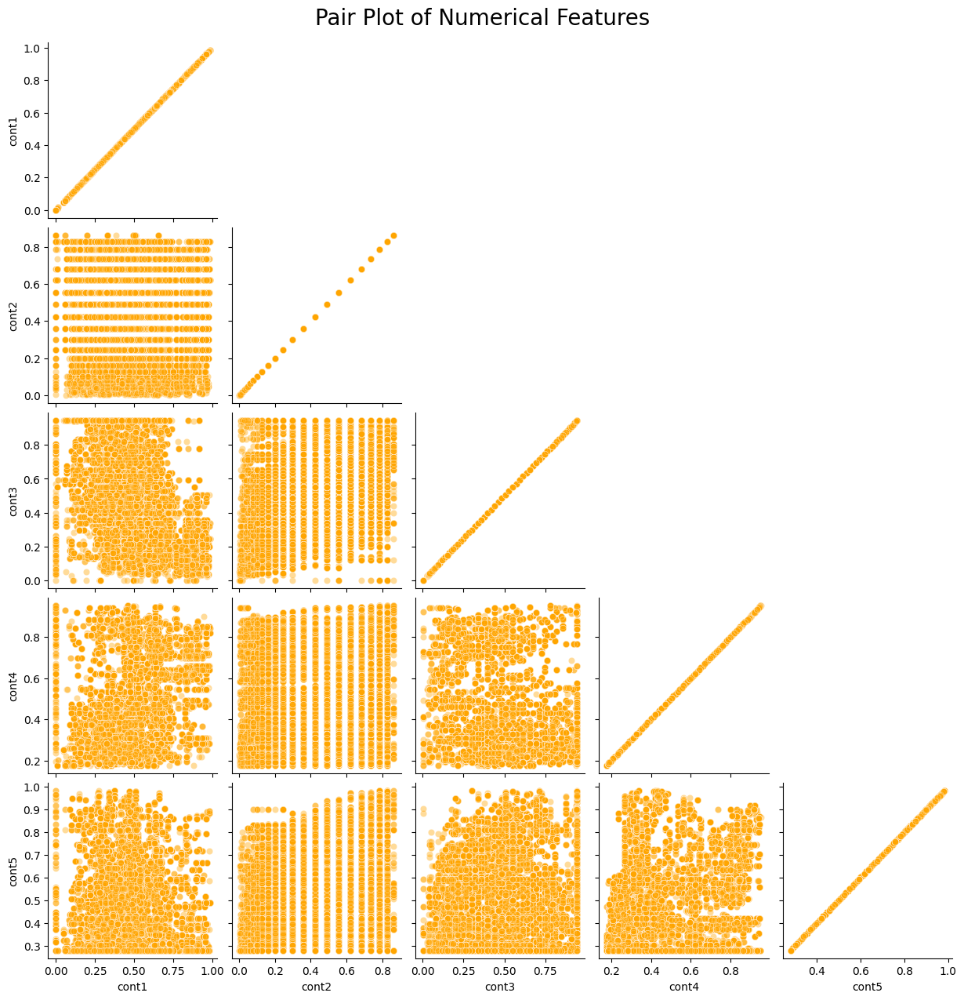

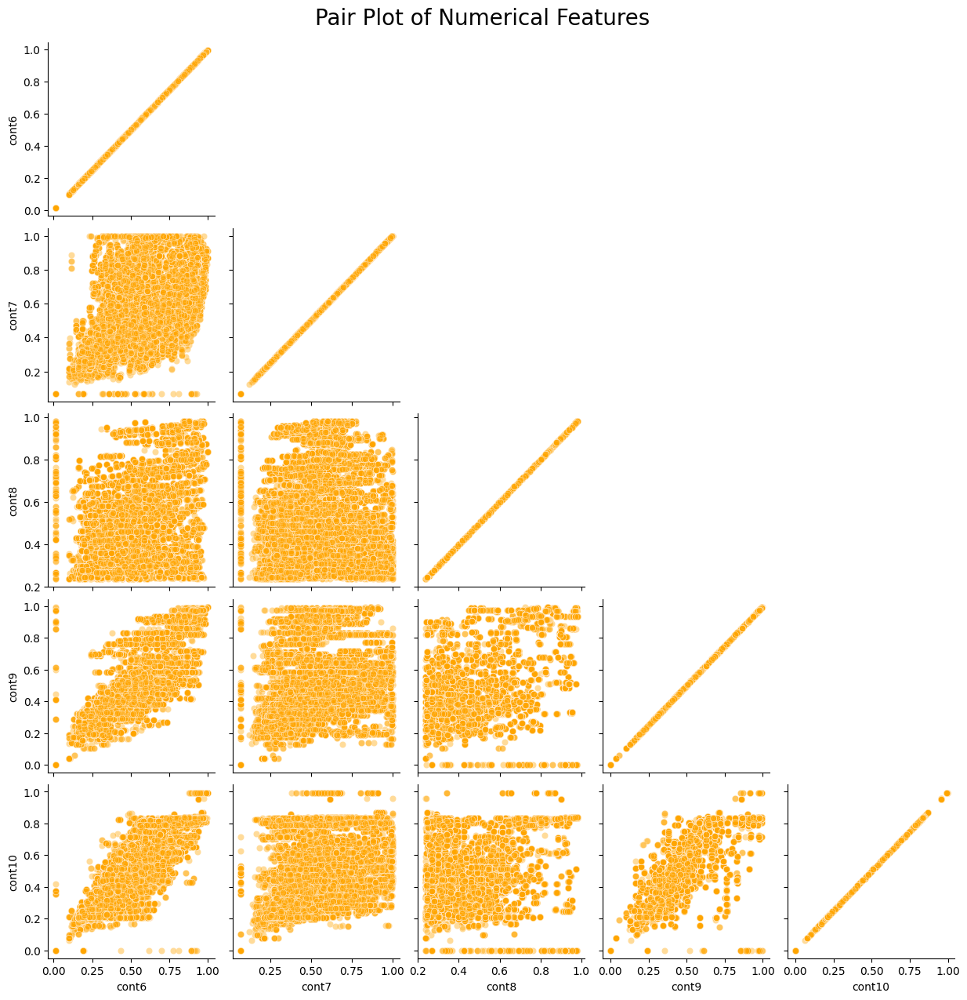

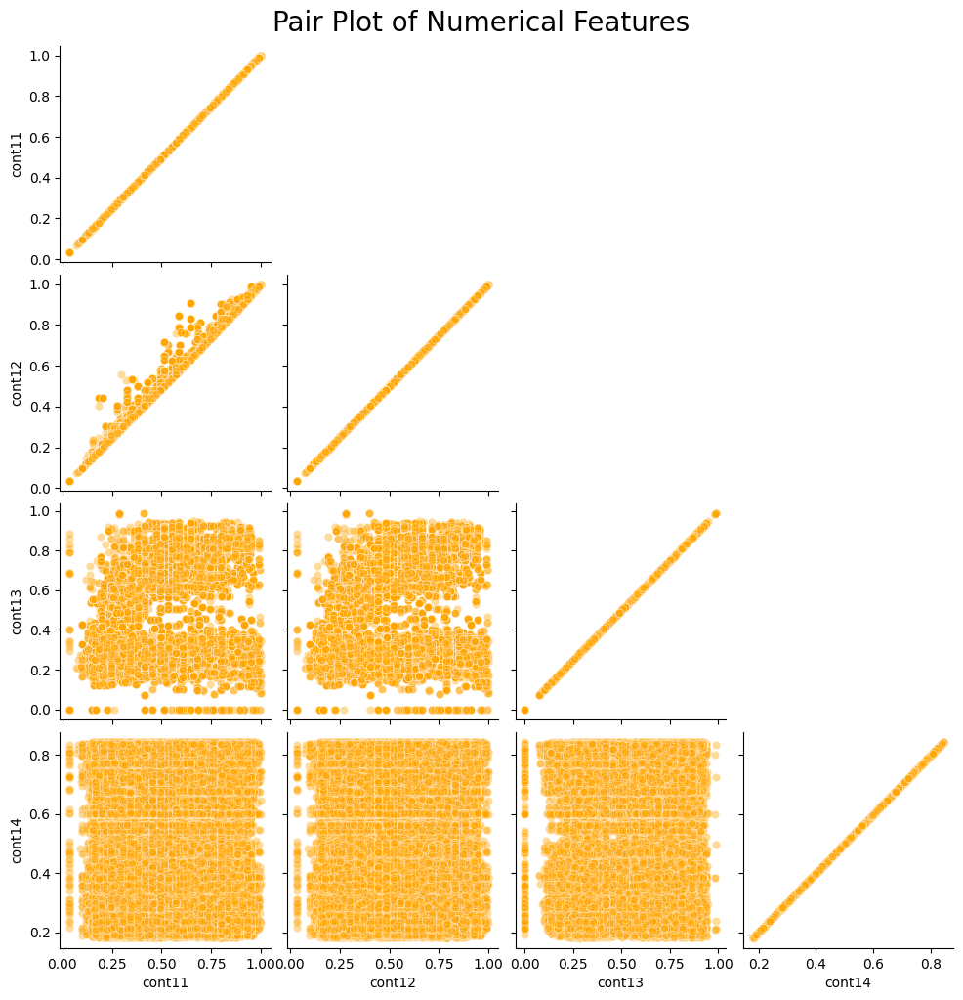

In [89]:
batch_size = 5
for i in range(0, len(num_cols), batch_size):
    g = sns.pairplot(
        data=df,
        vars=num_cols[i:i+batch_size],
        kind="scatter",
        diag_kind=None,
        corner=True,
        dropna=True,
        plot_kws={"color": "orange", "alpha": 0.4},
        diag_kws={"color": "orange"},
    )

    g.figure.suptitle(
        f"Pair Plot of Numerical Features",
        fontsize=20,
        y=1.02
    )
    plt.show()

### **<span style="color:orange;">2.2 Interactive Scatter Plot of Correlated Features</span>**

In [80]:
# Interactive Plot of cont11 and cont12
fig = px.scatter(
    data_frame=df,
    x='cont11',
    y='cont12',
    color_discrete_sequence=["orange"],
)
fig.update_traces(
    marker=dict(
        line=dict(color="black", width=1)
    )
)

fig.update_layout(
    xaxis=dict(
        rangeslider=dict(visible=True)
    ),
    title={
        "text": "Scatter Plot of cont11 vs cont12",
        "x": 0.5,
        "xanchor": "center",
        "font": {"size": 18}
    }
)

fig.show()

In [81]:
# Interactive Plot of cont1 and cont9
fig = px.scatter(
    data_frame=df,
    x='cont1',
    y='cont9',
    color_discrete_sequence=["orange"],
)
fig.update_traces(
    marker=dict(
        line=dict(color="black", width=1)
    )
)

fig.update_layout(
    xaxis=dict(
        rangeslider=dict(visible=True)
    ),
    title={
        "text": "Scatter Plot of cont1 vs cont9",
        "x": 0.5,
        "xanchor": "center",
        "font": {"size": 18}
    }
)

fig.show()